# Niger/Millet example

The aim of this notebook is to show how to use the SARRA-Py package to prepare data and perform atteinable yield simulations for millet in Niger. Also, we aim to compare results with MAPSPAM 2017.

# Imports

In [1]:
import numpy as np
import pandas as pd
from pcse.db import NASAPowerWeatherDataProvider
from pcse.util import reference_ET
import datetime
from matplotlib import pyplot as plt
from tqdm import tqdm as tqdm
import io
import xarray as xr
from sarra_py import *
import time
import geopandas as gpd
# deactivate futurewarnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Parallel run for multiple years

We use the same set of preparation steps as in DEV NIGER EXAMPLE notebook, except it is functionalized and allowed to run in parallel.

In [2]:
def run_model_per_year(year):

    date_start = datetime.date(year,5,1)
    duration = 220

    rainfall_data_path = "/mnt/d/climate_database/TAMSAT_v3.1_niger_rfe_filled_1983_2021_DL20230614/"
    climate_data_path = "/mnt/d/climate_database/AgERA5_niger_1981_2021_DL20230615/"


    grid_width, grid_height = get_grid_size(rainfall_data_path, date_start, duration)
    print("The grid is {} pixels wide by {} pixels high.".format(grid_width, grid_height))


    # initialize empty xarray dataset
    base_data = xr.Dataset()

    # load rainfall and weather data
    base_data = load_TAMSAT_data(base_data, rainfall_data_path, date_start, duration)
    base_data = load_AgERA5_data(base_data, climate_data_path, date_start, duration)

    # load soil parameters
    base_data = load_iSDA_soil_data(base_data, grid_width, grid_height)

    # compute day length raster
    base_data = calc_day_length_raster_fast(base_data, date_start, duration)


    # parameter file names
    file_paramVariete = "millet_variety.yaml"
    file_paramITK = "millet_niger_2017.yaml"
    file_paramTypeSol = "USA_iowa_V42.yaml"

    # load variety, cropping system and soil parameters
    paramVariete, paramITK, paramTypeSol = load_YAML_parameters(file_paramVariete, file_paramITK, file_paramTypeSol)

    # force change in sowing date year
    paramITK["DateSemis"] = datetime.date(year,5,1)

    # creato,g simulation xarray dataset by copying the base data
    data = base_data.copy()

    # initializing all the necessary variables
    data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
    data = initialize_default_irrigation(data)
    data = calculate_once_daily_thermal_time(data, paramVariete)


    data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)

    return data

In [3]:
# compare with reference dept dataset
# loading reference yield data, shp boundaries at ADM2 level and merging the two
FAO_data = pd.read_csv("./WorldBank_Niger/Official-Yields_2009-2020.csv")
admin_boundaries = gpd.read_file("./WorldBank_Niger/FEWS_NE_Admin2_2012/NE_Admin2_2012.shp") # <- file of 2012 boundaries provided bu Steffen, probably coming from FEWSnet as well 
FAO_merge = pd.merge(admin_boundaries, FAO_data, left_on="ADMIN2FR", right_on="ADMIN2", how="inner")

In [4]:
# use multiprocessing to speed up the process

def calc_corr(data, result, year):

    for i in range(len(FAO_merge)):

        # cropped_values = xr.where(rdt[j,:,:]==0, np.nan, rdt[j,:,:])
        cropped_values = data["rdt"][-1,:,:]

        # write crs to the cropped values
        cropped_values.rio.write_crs("epsg:4326", inplace=True)

        result = result.append(pd.DataFrame({
                                            "year": year,
                                            "ADMIN2FR": FAO_merge.loc[i,"ADMIN2FR"],
                                            "sim_rdt": cropped_values.rio.clip(gpd.GeoSeries(FAO_merge.iloc[i].geometry)).mean().values,
                                            "FAO_rdt":FAO_merge.loc[i,str(year)]
                                            }, index=[0]))
        
    return result


In [ ]:
# multiprocessing 
from multiprocessing import Pool
from functools import partial


In [10]:
result = pd.DataFrame()

def calc_results(year, result):
    data = run_model_per_year(year)
    result = calc_corr(data, result, year)
    del data
    return result

year=2018
result = calc_results(year, result)

The grid is 333 pixels wide by 437 pixels high.


100%|██████████| 220/220 [03:36<00:00,  1.02it/s]


In [11]:
# multiprocess the calc_results function over two cores using joblib
from joblib import Parallel, delayed

result = Parallel(n_jobs=2)(delayed(calc_results)(year, result) for year in range(2017,2019))

The grid is 333 pixels wide by 437 pixels high.
The grid is 333 pixels wide by 437 pixels high.


  0%|          | 0/220 [00:00<?, ?it/s]

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9)}

In [ ]:
admin_boundaries = gpd.read_file("./WorldBank_Niger/FEWS_NE_Admin2_2012/NE_Admin2_2012.shp")

In [ ]:
# compute the mean of data["rdt"] inside the limits of the first admin_boundaries
for i in range(len(admin_boundaries)):
    admin_boundaries.loc[i, "rdt"] = data["rdt"][-1,:,:].rio.clip(gpd.GeoSeries(admin_boundaries.iloc[i].geometry)).mean().values

In [ ]:
FAO_merge = pd.merge(admin_boundaries, FAO_data, left_on="ADMIN2FR", right_on="ADMIN2", how="inner")

In [ ]:
import plotly.express as px
px.scatter(FAO_merge, x="rdt", y="2016", hover_name="ADMIN2FR", trendline="ols", labels={
                     "rdt": "simulated yield (kg/ha)",
                     "2017": "official ADM02 yield (kg/ha)",
                     } )

# Simulating over multiple years to perform comparison with FAO stats

In [ ]:
import geopandas as gpd

In [ ]:
del base_data
del data

NameError: name 'base_data' is not defined

In [ ]:


results = pd.DataFrame()


for year in tqdm(range(2015,2016)):

    date_start = datetime.date(year,5,1)
    duration = 240



    grid_width, grid_height = get_grid_size(rainfall_data_path, date_start, duration)
    print("The grid is {} pixels wide by {} pixels high.".format(grid_width, grid_height))



    # initialize empty xarray dataset
    base_data = xr.Dataset()

    # load rainfall and weather data
    base_data = load_TAMSAT_data(base_data, rainfall_data_path, date_start, duration)
    base_data = load_AgERA5_data(base_data, climate_data_path, date_start, duration)

    # load soil parameters
    base_data = load_iSDA_soil_data(base_data, grid_width, grid_height)

    # compute day length raster
    base_data = calc_day_length_raster(base_data, date_start, duration)



    # parameter file names
    file_paramVariete = "millet_variety.yaml"
    file_paramITK = "millet_niger_2017.yaml"
    file_paramTypeSol = "USA_iowa_V42.yaml"

    # load variety, cropping system and soil parameters
    paramVariete, paramITK, paramTypeSol = load_YAML_parameters(file_paramVariete, file_paramITK, file_paramTypeSol)



    # updating the sowing date
    paramITK["dateSemis"] = datetime.date(year, paramITK["DateSemis"].month, paramITK["DateSemis"].day)



    # creato,g simulation xarray dataset by copying the base data
    data = base_data.copy()

    # initializing all the necessary variables
    data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
    data = initialize_default_irrigation(data)
    data = calculate_once_daily_thermal_time(data, paramVariete)



    data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)



    FAO_data = pd.read_csv("./WorldBank_Niger/Official-Yields_2009-2020.csv")



    admin_boundaries = gpd.read_file("./WorldBank_Niger/FEWS_NE_Admin2_2012/NE_Admin2_2012.shp")



    # compute the mean of data["rdt"] inside the limits of the first admin_boundaries
    for i in range(len(admin_boundaries)):
        admin_boundaries.loc[i, "rdt"] = data["rdt"][-1,:,:].rio.clip(gpd.GeoSeries(admin_boundaries.iloc[i].geometry)).mean().values



    FAO_merge = pd.merge(admin_boundaries, FAO_data, left_on="ADMIN2FR", right_on="ADMIN2", how="inner")



    import plotly.express as px
    px.scatter(FAO_merge, x="rdt", y="2016", hover_name="ADMIN2FR", trendline="ols", labels={
                        "rdt": "simulated yield (kg/ha)",
                        "2017": "official ADM02 yield (kg/ha)",
                        } )



    FAO_merge["year"] = year



    results = results.append(FAO_merge)

    del base_data
    del data



  0%|          | 0/1 [00:00<?, ?it/s]

The grid is 333 pixels wide by 437 pixels high.


100%|██████████| 240/240 [08:25<00:00,  2.11s/it]
/tmp/ipykernel_2711/949270995.py:90: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

100%|██████████| 1/1 [12:28<00:00, 748.25s/it]


In [ ]:
results

,FNID_x,EFF_YEAR,COUNTRY,ADMIN0,ADMIN1_x,ADMIN1FR,ADMIN1SP,ADMIN1PT,ADMIN2_x,ADMIN2FR,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,year
0,NE2012A20517,2012,NE,Niger,Tahoua,Tahoua,None,None,Tillia,Tillia,...,362.0,291.0,203.0,320.0,244.0,397.0,422.0,359.0,435.0,2015
1,NE2012A20608,2012,NE,Niger,Tillaberi,Tillabéri,None,None,Abala,Abala,...,402.0,406.0,373.0,513.0,388.0,413.0,486.0,448.0,402.0,2015
2,NE2012A20613,2012,NE,Niger,Tillaberi,Tillabéri,None,None,Torodi,Torodi,...,582.0,405.0,462.0,488.0,480.0,444.0,360.0,450.0,614.0,2015
3,NE2012A20106,2012,NE,Niger,Agadez,Agadez,None,None,Aderbissinat,Aderbissinat,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015
4,NE2012A20105,2012,NE,Niger,Agadez,Agadez,None,None,Arlit,Arlit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015
5,NE2012A20103,2012,NE,Niger,Agadez,Agadez,None,None,Bilma,Bilma,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015
6,NE2012A20108,2012,NE,Niger,Agadez,Agadez,None,None,Ingall,Ingall,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015
7,NE2012A20205,2012,NE,Niger,Diffa,Diffa,None,None,Bosso,Bosso,...,529.0,355.0,479.0,358.0,517.0,370.0,350.0,251.0,288.0,2015
8,NE2012A20204,2012,NE,Niger,Diffa,Diffa,None,None,Diffa,Diffa,...,530.0,380.0,383.0,422.0,529.0,442.0,441.0,306.0,450.0,2015
9,NE2012A20207,2012,NE,Niger,Diffa,Diffa,None,None,Goudoumaria,Goudoumaria,...,493.0,352.0,302.0,307.0,509.0,541.0,475.0,337.0,350.0,2015


In [ ]:
data["rdt"]

NameError: name 'data' is not defined

In [ ]:
results["FAO"] = results.apply(lambda x: x[str(x["year"])], axis=1)

In [ ]:
results["rdt"]

0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
21    0.0
22    0.0
23    0.0
24    0.0
25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
44    0.0
45    0.0
46    0.0
47    0.0
48    0.0
49    0.0
50    0.0
51    0.0
52    0.0
53    0.0
Name: rdt, dtype: float64

In [ ]:
import plotly.express as px
px.scatter(results, x="rdt", y="FAO", hover_name="ADMIN2FR", color="year", trendline="ols", labels={
                     "rdt": "simulated yield (kg/ha)",
                     "FAO": "official ADM02 yield (kg/ha)",
                     } )

In [ ]:
xx

# calibration through optimization

In [ ]:
del data

In [ ]:
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_PMIL_S.tif")

In [ ]:
from sklearn.metrics import r2_score

def optimize(SDJBVP, SDJMatu1, KRdtPotA,PPExp,PPSens,TxConversion, FeuilAeroPente, SlaMin,    base_data=base_data, mapspam_data=mapspam_data) :

    data = base_data.copy()
    
    data = initialize_default_irrigation(data)
    data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
    data = calculate_once_daily_thermal_time(data, paramVariete)

    paramVariete["SDJBVP"] = SDJBVP
    paramVariete["SDJMatu1"] = SDJMatu1
    paramVariete["KRdtPotA"] = KRdtPotA
    paramVariete["PPExp"] = PPExp
    paramVariete["PPSens"] = PPSens
    paramVariete["TxConversion"] = TxConversion
    paramVariete["FeuilAeroPente"] = FeuilAeroPente
    paramVariete["SlaMin"] = SlaMin

    start_time = time.time()
    data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)
    print("--- %s seconds, %s second per iter ---" % ((time.time() - start_time), (time.time() - start_time)/duration))
    
    mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

    df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
    df = df[df["rdt"]>0]
    df = df[df["mapspam"]>0]
    corr = df[['rdt', 'mapspam']].corr().iloc[0,1]
    # use sklearn.metrics to compute the R2 score
    R2_score = r2_score(df["rdt"], df["mapspam"])

    # compute the difference between the two datasets and plot the map
    diff = data["rdt"][-1,:,:] - mapspam_data
    diff.plot(cmap="RdBu_r", vmin=-2000, vmax=2000)
    plt.rcParams['figure.figsize'] = [8,6]
    plt.show()

    # delete data to free memory
    del data

    return corr

In [ ]:
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
pbounds = {"SDJBVP":(260.0,850.0),
            "SDJMatu1":(225.0, 450.0),
            "KRdtPotA":(0.15, 0.6),
            "PPExp":(0.0, 0.3),
            "PPSens":(0.4, 5.0),
            "TxConversion":(2.5, 5.5),
            "FeuilAeroPente":(-0.0002, -0.00005),
            "SlaMin":(0.0013, 0.0023),
            }

optimizer = BayesianOptimization(
    f=optimize,
    pbounds=pbounds,
    random_state=1,
)

In [ ]:
optimizer.maximize(
    init_points=2,
    n_iter=150,
)

|   iter    |  target   | FeuilA... | KRdtPotA  |   PPExp   |  PPSens   |  SDJBVP   | SDJMatu1  |  SlaMin   | TxConv... |
-------------------------------------------------------------------------------------------------------------------------


: 

: 

In [ ]:
optimizer.max

In [ ]:
#calcul du nombre de jours consécutifs où cstr est en dessous d'un seuil donné ; si cstr est au dessus du seuil, le compteur est remis à 0
cstr_thr = 0.5
day_thr=10

data["day_under_cstr_thres"] = xr.where(data["cstr"]<cstr_thr, 1, 0)

# copy as zeros
data["count_of_days_under_cstr_thres"] = xr.zeros_like(data["day_under_cstr_thres"])

for j in tqdm(range(duration)):
    data["count_of_days_under_cstr_thres"][j:,:,:] = xr.where(
        data["day_under_cstr_thres"][j,:,:]==1,
        data["count_of_days_under_cstr_thres"][j,:,:]+1,
        0,
    )
 
data["days_under_cstr_thres_above_day_thr"] = xr.zeros_like(data["day_under_cstr_thres"])
data["days_under_cstr_thres_above_day_thr"] = xr.where(
    data["count_of_days_under_cstr_thres"]>day_thr,
    1,
    0,
)

data["impact_at_critical_phase"] = xr.zeros_like(data["days_under_cstr_thres_above_day_thr"])
data["impact_at_critical_phase"] = xr.where(
    (data["days_under_cstr_thres_above_day_thr"]==1) & ((data["numPhase"]==4)|(data["numPhase"]==5)),
    1,
    0,
)

100%|██████████| 180/180 [00:01<00:00, 113.32it/s]


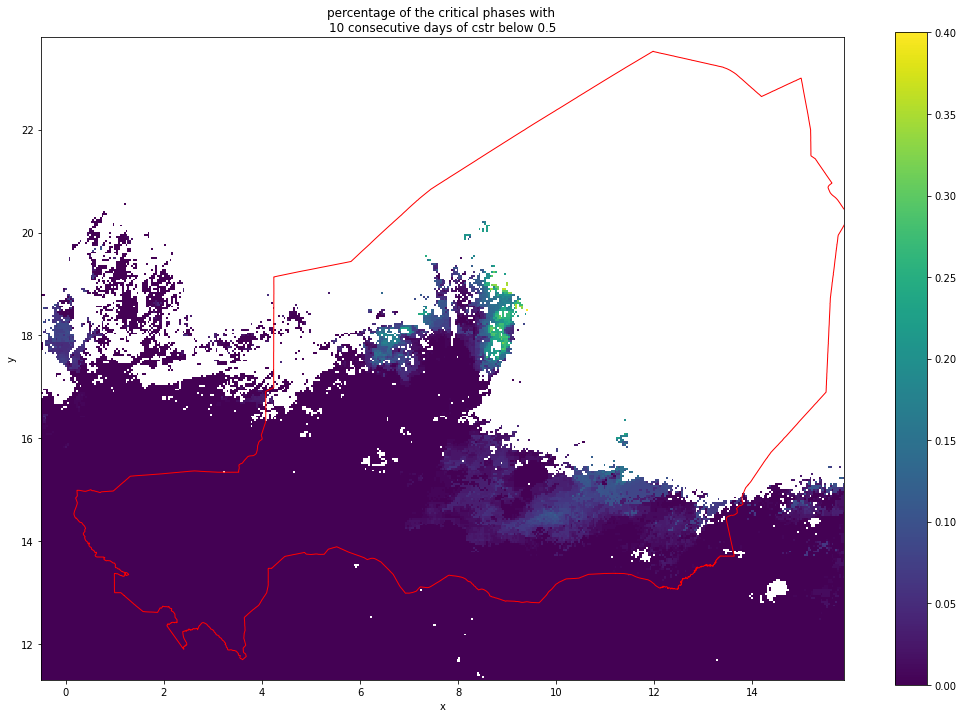

In [ ]:

xr.where(np.isnan(data["ru"]),np.nan,data[variable].mean(dim="time")).plot()
# download and add ADM0 boundaries for Niger
gdf = gpd.read_file("https://biogeo.ucdavis.edu/data/gadm3.6/shp/gadm36_NER_shp.zip")
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='red', linewidth=1.0)
plt.title("percentage of the critical phases with \n%s consecutive days of cstr below %s" % (day_thr, cstr_thr))
# make figure bigger
plt.gcf().set_size_inches(18, 12)
plt.show()

In [ ]:
variable = "days_under_cstr_thres_above_day_thr"
time_resolution = 5
vmax = data[variable].max().values
for i in range(int(round(duration/time_resolution,0))):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][time_resolution*i,:,:]).plot(vmin=0, vmax=vmax)
    plt.title("Day %s" % (i*time_resolution))
    plt.show()

In [ ]:
variable = "impact_at_critical_phase"
time_resolution = 5
vmax = data[variable].max().values
for i in range(int(round(duration/time_resolution,0))):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][time_resolution*i,:,:]).plot(vmin=0, vmax=vmax)
    plt.title("Day %s" % (i*time_resolution))
    plt.show()

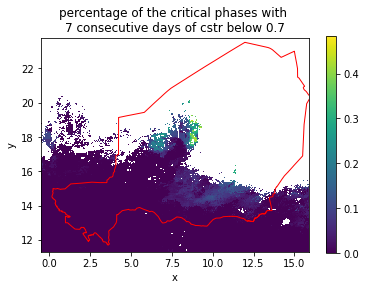

In [ ]:
data["mapspam"]=mapspam_data

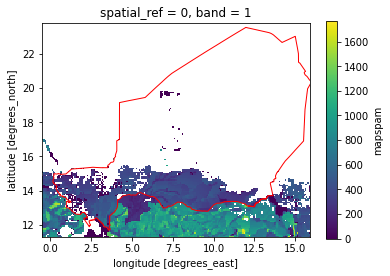

In [ ]:

data["mapspam"].plot()
# download and add ADM0 boundaries for Niger
gdf = gpd.read_file("https://biogeo.ucdavis.edu/data/gadm3.6/shp/gadm36_NER_shp.zip")
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='red', linewidth=1.0)

plt.show()

In [ ]:
# mean on a sliding window
variable = "impact_at_critical_phase"
window_width = 10
vmax = data[variable].max().values
for i in range(duration-window_width):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][i:i+window_width,:,:].mean(dim="time")).plot(vmin=0, vmax=vmax)
    # plt.title("Day %s" % (i*time_resolution))
    plt.show()

## Loading MAPSPAM 2017 data

In [ ]:
# file was gathered from https://dataverse.harvard.edu/file.xhtml?fileId=4271678&version=3.0
# rainfed high inputs production (H)
# load image into a xarray dataarray
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_PMIL_S.tif")

In [ ]:
# reproject the dataarray to the same projection and resolution as the simulation
mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

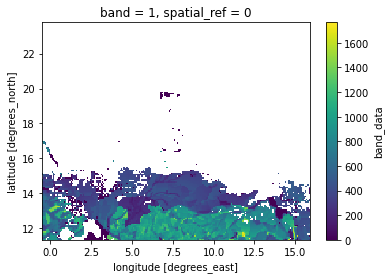

In [ ]:
mapspam_data.plot()

In [ ]:
# do a scatterplot of the values of the data["rdt"] against mapspam_data using plotly express
# remove the null values from the two datasets
# add a trendline to the scatterplot
import plotly.express as px
df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
df = df[df["rdt"]>0]
df = df[df["mapspam"]>0]
fig = px.scatter(df, x="rdt", y="mapspam", trendline="ols")
fig.show()



In [ ]:
corr = df[['rdt', 'mapspam']].corr()
corr.iloc[0,1]

0.5958013935050981

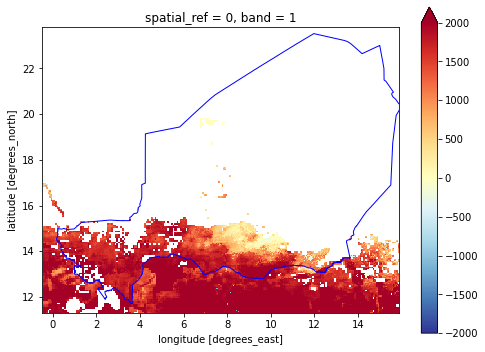

In [ ]:
# compute the difference between the two datasets and plot the map
diff = data["rdt"][-1,:,:] - mapspam_data
diff.plot(cmap="RdYlBu_r", vmin=-2000, vmax=2000)
plt.rcParams['figure.figsize'] = [8,6]
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='blue', linewidth=1.0)
plt.show()


# on refait sarra

In [ ]:
# creato,g simulation xarray dataset by copying the base data
data = base_data.copy()

# initializing all the necessary variables
data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
data = initialize_default_irrigation(data)
data = calculate_once_daily_thermal_time(data, paramVariete)

NameError: name 'paramVariete' is not defined